<h1> Connect to Google Drive 



In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


<h1> Copy Data From Drive To Working Dir </h1>

In [ ]:
print('Copying data to working dir. This takes about 5 mins')
!cp -r /content/drive/My\ Drive/data.zip .
print('Done')

Copying data to working dir. This takes about 5 mins
cp: cannot stat '/content/drive/My Drive/data.zip': No such file or directory
Done


<h1> Unzip the data </h1>

In [ ]:
!rm -r data/
!unzip -q data.zip 
print('Done')

rm: cannot remove 'data/': No such file or directory
Done


<h1> Create augmented duplicates of malignant images to oversample <h1>

In [ ]:
import os
from random import randint
from PIL import Image
from tqdm.notebook import tqdm

dirs = ['./data/train/benign/', "./data/train/benign/", "./data/train/benign/"]
pos_dirs = ['./data/train/malignant/']
for i in range(len(dirs)):
  dir = dirs[i]
  pos_dir = pos_dirs[i]
  count = 0
  num_images = len(os.listdir(dir))
  num_positive = len(os.listdir(pos_dir))
  while count < num_images - num_positive:
    for image in tqdm(os.listdir(pos_dir)):
      if count >= num_images - num_positive:
        break
      path = os.path.join(pos_dir, image)
      pill_img = Image.open(path).rotate(randint(10, 250))
      pill_img.save(
          os.path.join(
              pos_dir, 
              str(randint(0, 10000000)) + image
          )
      )

      count += 1

<h1> Remove images to undersample benign dataset </h1>
<p>Note: <b>This cell should always be run to ensure a ballanced dataset <b> </p>

In [ ]:
import os
import shutil
from random import randint

dirs = ['./data/train/benign/']
pos_dirs = ['./data/train/malignant/']
for i in range(len(dirs)):
  dir = dirs[i]
  pos_dir = pos_dirs[i]
  count = 0
  num_images = len(os.listdir(dir))
  num_positive = len(os.listdir(pos_dir))
  print(num_images, num_positive)
  for image in os.listdir(dir):
    if count >= num_images - num_positive:
      break
    os.remove(
        os.path.join(dir, image)
    )
    count += 1

16596 16596


<h1> Create Augmented images </h1> 

In [ ]:
import os
from random import randint
from PIL import Image, ImageFilter
from tqdm.notebook import tqdm
import numpy as np

dirs = ['./data/validation/benign/', './data/train/benign/', './data/validation/malignant/', './data/train/malignant/']

for dir in tqdm(dirs):
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )
    #rotate image
    pill_img = Image.open(path).rotate(randint(10, 250))
    pill_img.save(
        os.path.join(
            dir, 
            str(randint(0, 10000000)) + image
        )
    )

    pill_img = pill_img.filter(ImageFilter.BLUR)
    pill_img.save(
        os.path.join(
            dir, 
            str(randint(0, 10000000)) + image
        )
    )
    


KeyboardInterrupt: ignored

<h1> Create Augmented Test Images </h1>
<ul>
  <li>Rotate Images - Each image is randomly rotated between 
    <b>20</b> - <b>90</b> degrees
  </li>
  <li>Flip Images. Each image is rotated <b>180</b> degrees</li>
  <li>Brighten Images </li>
  <li>Darken Images</li>
  <li>Blurr Images</li>
  <li>Increase Contrast</li>
  <li>Decrease Contrast </li>

</ul>

In [ ]:
import PIL
from PIL import ImageEnhance
base_dirs = ['./data/test/benign/', './data/test/malignant/',]

<h4>Make dirs to store augmented images</h4>


In [ ]:
parent_dirs = ['./data/test_rotated/', './data/test_flipped/',
               './data/test_brightened/', './data/test_darkened/',
               './data/test_blurred/', './data/test_high_contrast/',
               './data/test_low_contrast/']
sub_dirs = ['benign/', 'malignant/']

for dir in parent_dirs:
  try:
    os.mkdir(dir)
  except:
    continue
  for sub_dir in sub_dirs:
    try:
      os.mkdir(
          os.path.join(dir, sub_dir)
      )
    except:
      continue

<h3> Rotate images </h3>

In [ ]:
new_image_dirs = ['./data/test_rotated/benign/', './data/test_rotated/benign/']

for i in range(len(base_dirs)):
  dir = base_dirs[i]
  new_dir = new_image_dirs[i]
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )
    #rotate image
    pill_img = Image.open(path).rotate(randint(20, 90))
    pill_img.save(
        os.path.join(
            new_dir, 
            image
        )
    )

<h3> Flip Image </h3>

In [ ]:
new_image_dirs = ['./data/test_flipped/benign/', './data/test_flipped/benign/']

for i in range(len(base_dirs)):
  dir = base_dirs[i]
  new_dir = new_image_dirs[i]
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )
    #rotate image
    pill_img = Image.open(path).rotate(randint(20, 90))
    pill_img.save(
        os.path.join(
            new_dir, 
            image
        )
    )

<h3>Brighten Images </h3<

In [ ]:
new_image_dirs = ['./data/test_brightened/benign/', './data/test_brightened/benign/']

for i in range(len(base_dirs)):
  dir = base_dirs[i]
  new_dir = new_image_dirs[i]
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )
  
    pill_img = Image.open(path).transpose(PIL.Image.FLIP_LEFT_RIGHT)
    enhancer = ImageEnhance.Brightness(pill_img)
    pill_image = enhancer.enhance(1.8)
    pill_img.save(
        os.path.join(
            new_dir, 
            image
        )
    )

<h3> Darken Image </h3> 

In [ ]:
new_image_dirs = ['./data/test_darkened/benign/', './data/test_darkened/benign/']

for i in range(len(base_dirs)):
  dir = base_dirs[i]
  new_dir = new_image_dirs[i]
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )
    #rotate image
    enhancer = ImageEnhance.Brightness(pill_img)
    pill_image = enhancer.enhance(0.8)
    pill_img = Image.open(path).transpose(PIL.Image.FLIP_LEFT_RIGHT)
    enhancer = ImageEnhance.Brightness(pill_img)
    pill_image = enhancer.enhance(0.8)
    pill_img.save(
        os.path.join(
            new_dir, 
            image
        )
    )

<h3> Blur Image </h3>

In [ ]:
new_image_dirs = ['./data/test_blurred/benign/', './data/test_blurred/benign/']

for i in range(len(base_dirs)):
  dir = base_dirs[i]
  new_dir = new_image_dirs[i]
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )
    #rotate image
    pill_img = Image.open(path)
    pill_img = pill_img.filter(ImageFilter.BLUR)
    pill_img.save(
        os.path.join(
            new_dir, 
            image
        )
    )

<h3> Increase Contrast </h3>

In [ ]:
new_image_dirs = ['./data/test_high_contrast/benign/', './data/test_high_contrast/benign/']

for i in range(len(base_dirs)):
  dir = base_dirs[i]
  new_dir = new_image_dirs[i]
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )
    #rotate image
    pill_img = Image.open(path)
    enhancer = ImageEnhance.Contrast(pill_image)
    pill_image = enhancer.enhance(1.5)
    pill_img.save(
        os.path.join(
            new_dir, 
            image
        )
    )

<h3> Decrease Contrast </h3>

In [ ]:
new_image_dirs = ['./data/test_low_contrast/benign/', './data/test_low_contrast/benign/']

for i in range(len(base_dirs)):
  dir = base_dirs[i]
  new_dir = new_image_dirs[i]
  for image in tqdm(os.listdir(dir)):
    path = os.path.join(
        dir,
        image
    )test_rotated
    #rotate image
    pill_img = Image.open(path)
    enhancer = ImageEnhance.Contrast(pill_image)
    pill_image = enhancer.enhance(0.5)
    pill_img.save(
        os.path.join(
            new_dir, 
            image
        )
    )

<h3> Display Images </h3<

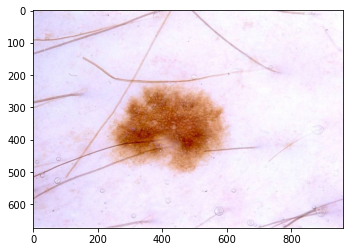

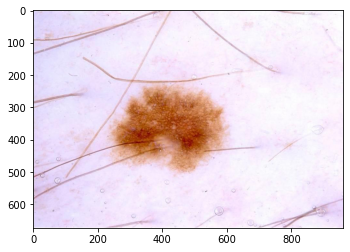

In [ ]:
plt.imshow(image.load_img('data/test/benign/ISIC_0000220.jpg'))
plt.figure()
plt.imshow(image.load_img('data/test_high_contrast/benign/ISIC_0000220.jpg'))


<h1> Import Modules </h1>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from random import randint
from PIL import Image, ImageFilter

import os

from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.applications.resnet50 import preprocess_input

from tensorflow.keras.models import load_model

from tensorflow.keras.optimizers import SGD, Adam

from tensorflow.keras.callbacks import EarlyStopping

from tensorflow.keras.applications import ResNet50, NASNetLarge, InceptionResNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input 
from tensorflow.keras.applications.resnet50 import decode_predictions

<h1> Display an Image </h1>
<p> This is to verify the above steps worked </p>

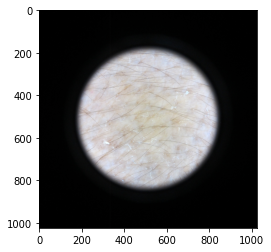

In [ ]:
img = image.load_img('data/train/benign/ISIC_0062126.jpg')
plt.imshow(img)

<h1> Generate Train and Validation Data <h1>

In [ ]:
train = ImageDataGenerator(rescale=1/255)
validation = ImageDataGenerator(rescale=1/255)
image_size = 200
batch_size = 50

train_dataset = train.flow_from_directory(
    'data/train',
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True,
)

validation_dataset = train.flow_from_directory(
    'data/validation',
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True,
)

test_dataset = train.flow_from_directory(
    'data/test',
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True,
)
print("Training data", collections.Counter(train_dataset.classes))
print("Testing data", collections.Counter(test_dataset.classes))
print("Validation data", collections.Counter(validation_dataset.classes))

Found 33192 images belonging to 2 classes.
Found 2551 images belonging to 2 classes.
Found 2555 images belonging to 2 classes.
Training data Counter({0: 16596, 1: 16596})
Testing data Counter({0: 2104, 1: 451})
Validation data Counter({0: 2109, 1: 442})


<h1> Create Model </h1>

In [ ]:
nasnet_base = ResNet50(weights="imagenet", include_top=False, input_shape=(image_size, image_size, 3))

In [ ]:
network = Sequential()
network.add(nasnet_base)
nasnet_base.trainable = False
network.add(Flatten())

network.add(Dropout(0.5))
network.add(Dense(128, activation="relu"))
network.add(Dropout(0.5))
network.add(Dense(1, activation="softmax"))



                
                    

<h1> Compile Model </h1>

In [ ]:
METRICS = [
           tf.keras.metrics.BinaryAccuracy(name="accuracy"),
          #  tf.keras.metrics.Precision(name="precision"),
          #  tf.keras.metrics.Recall(name="recall"),
          #  tf.keras.metrics.AUC(name="auc"),

]
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
              optimizer=tf.keras.optimizers.Adam(
                  learning_rate=0.0003,
                  name='Adam'
              ),
              metrics=METRICS)


<h1> Fit model </h1>

In [ ]:
model_fit = model.fit(
    train_dataset,
    steps_per_epoch=len(train_dataset) // batch_size,
    epochs=100,
    validation_data=validation_dataset,
    callbacks=[EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)],
    batch_size=batch_size,
    class_weight={0: 0.5, 1: 0.5}
)

Epoch 1/100
13/13 [==============================] - 53s 4s/step - loss: 0.4032 - accuracy: 0.5167 - val_loss: 0.7019 - val_accuracy: 0.3414
Epoch 2/100
13/13 [==============================] - 48s 4s/step - loss: 0.3160 - accuracy: 0.6919 - val_loss: 0.6326 - val_accuracy: 0.8032
Epoch 3/100
13/13 [==============================] - 49s 4s/step - loss: 0.2864 - accuracy: 0.8119 - val_loss: 0.5745 - val_accuracy: 0.8236
Epoch 4/100
13/13 [==============================] - 48s 4s/step - loss: 0.2531 - accuracy: 0.8257 - val_loss: 0.5649 - val_accuracy: 0.8083
Epoch 5/100
13/13 [==============================] - 48s 4s/step - loss: 0.2415 - accuracy: 0.8178 - val_loss: 0.5237 - val_accuracy: 0.8193
Epoch 6/100
13/13 [==============================] - 49s 4s/step - loss: 0.2189 - accuracy: 0.8347 - val_loss: 0.5296 - val_accuracy: 0.7922
Epoch 7/100
13/13 [==============================] - 48s 4s/step - loss: 0.2092 - accuracy: 0.8430 - val_loss: 0.4774 - val_accuracy: 0.8212
Epoch 8/100
1

In [ ]:
nasnet_base.trainable = True
network.compile(optimizer=Adam(
                  learning_rate=0.0005,
                  name='Adam'), loss="binary_crossentropy", metrics=["accuracy"])
nn_v3_tuned_history = network.fit(
                train_dataset, steps_per_epoch=len(train_dataset) // batch_size, epochs=100, 
                validation_data=validation_dataset,
                callbacks=[EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)],
                verbose=1)

Epoch 1/100
13/13 [==============================] - 55s 4s/step - loss: 0.9007 - accuracy: 0.5419 - val_loss: 265241.4688 - val_accuracy: 0.1733
Epoch 2/100
13/13 [==============================] - 47s 4s/step - loss: 0.3280 - accuracy: 0.5046 - val_loss: 537696.8750 - val_accuracy: 0.1733
Epoch 3/100
13/13 [==============================] - 47s 4s/step - loss: 0.3455 - accuracy: 0.4745 - val_loss: 603746.0625 - val_accuracy: 0.1733
Epoch 4/100
13/13 [==============================] - 48s 4s/step - loss: 0.3464 - accuracy: 0.4907 - val_loss: 14883.6475 - val_accuracy: 0.1733
Epoch 5/100
13/13 [==============================] - 49s 4s/step - loss: 0.4994 - accuracy: 0.5068 - val_loss: 0.6009 - val_accuracy: 0.1733
Epoch 6/100
13/13 [==============================] - 48s 4s/step - loss: 0.2705 - accuracy: 0.4721 - val_loss: 0.4650 - val_accuracy: 0.1733
Epoch 7/100
13/13 [==============================] - 48s 4s/step - loss: 0.3299 - accuracy: 0.5342 - val_loss: 0.5129 - val_accuracy: 0

In [ ]:
sub from google.colab import files
files.upload()

Saving cancer.zip to cancer (1).zip


{'cancer.zip': b'PK\x03\x04\n\x00\x00\x00\x00\x00\xae\x81lQ\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x1c\x00cancer/UT\t\x00\x03\'_\xad_\'_\xad_ux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00PK\x03\x04\n\x00\x00\x00\x00\x00\xad\x81lQ\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x1c\x00cancer/assets/UT\t\x00\x03&_\xad_\'_\xad_ux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00PK\x03\x04\x14\x00\x00\x00\x08\x00\xae\x81lQ\xdb\xa9D\x8f\xa6X\x00\x00DG\x03\x00\x15\x00\x1c\x00cancer/saved_model.pbUT\t\x00\x03\'_\xad_\'_\xad_ux\x0b\x00\x01\x04\x00\x00\x00\x00\x04\x00\x00\x00\x00\xd4]\xf9\x7f\x1b\xc7u\xe7\x82\x07\x96\x8f\xf7\x88\x96\xa0\xa1(\xd1\x94,Qpl\x92\x8b\x95D\xc1N\xaa\xc3v$Y\x8a\x14\xea\xf2\x91\x06\x81\xc8%\x85\x18\x04h\x00\x84\x0e+\x89c\'\xad\x9d\xa4\xb9k\xd7N\xe3$N\xe2$N\xec8\xee\x956\xadS\xa7G\xdc~\xfa\xe9\xaf=~\xeb\x1f\xd1\xdf\xd2O:\xb3\x07\xf6\x98\x99\xdd\xd9\x05h\xb7\xd2\x07\xc4\xec`\xe6\xbd\xf7\x9d\xf7\xe6\xed\x1c;oU\x05\xbd\xf5\xc5!\xf8\x97\x1e\

In [ ]:
accuracy = model.evaluate(test_dataset)

# model.evaluate(test_blurred_dataset)
# model.evaluate(test_brightened_dataset)
# model.evaluate(test_darkened_dataset)
# # model.evaluate(test_flipped_dataset)
# model.evaluate(test_high_contrast_dataset)
# model.evaluate(test_low_contrast_dataset)
# model.evaluate(test_rotated_dataset)

52/52 [==============================] - 46s 893ms/step - loss: 0.4655 - accuracy: 0.8235


In [ ]:
accuracy

[0.37605729699134827,
 0.8212927579879761,
 0.9470899701118469,
 0.6806083917617798,
 0.9306154251098633]

In [ ]:
from keras.preprocessing import image
from random import shuffle

amount = 500

neg = os.listdir('./data/validation/benign/')
pos = os.listdir('./data/validation/malignant/')

shuffle(neg)
shuffle(pos)

neg = neg[:amount]
pos = pos[:amount]

negitive_0 = 0
negitive_1 = 0
for path in neg:
  img = image.load_img(os.path.join(
      './data/validation/benign/',
      path
  ), target_size=(image_size, image_size))

  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict_classes(images, batch_size=10)
  if classes[0][0]:
    negitive_1 += 1
  else:
    negitive_0 += 1
print(negitive_0, negitive_1)

positive_0 = 0
positive_1 = 0

for path in pos:
  img = image.load_img(os.path.join(
      './data/validation/malignant/',
      path
  ), target_size=(image_size, image_size))

  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = model.predict_classes(images, batch_size=10)
  if classes[0][0]:
    positive_1 += 1
  else:
    positive_0 += 1
print(positive_0, positive_1)



Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
416 84
114 386


In [ ]:
model.save('cancer')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: cancer/assets


In [ ]:
!zip -r cancer.zip cancer

  adding: cancer/ (stored 0%)
  adding: cancer/assets/ (stored 0%)
  adding: cancer/saved_model.pb (deflated 89%)
  adding: cancer/variables/ (stored 0%)
  adding: cancer/variables/variables.data-00000-of-00001 (deflated 14%)
  adding: cancer/variables/variables.index (deflated 68%)


In [ ]:
from google.colab import files
files.download('cancer.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>